# Using Amazon Rekognition, Amazon Comprehend Medical and AWS Lambda to redact medical images

Medical Imaging is the most intanglible element in medical practice in this day and age. Thanks to modern medical imaging modalities, practitioners and scientists can learn more about the human body than ever before. 

Link [1](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4450976/)
[2](https://www.xray.com.au/importance-of-medical-imaging/)

![lamdba-architecture](PHI_Redaction_using_Sagemaker.jpg "PHI Redaction using Sagemaker environment")

In [1]:
import numpy as np
import boto3
from PIL import  ImageDraw, Image
import matplotlib.pyplot as plt
from io import BytesIO
from IPython.display import display, Image as IMG

In [2]:
rekognition = boto3.client('rekognition')
s3_resource = boto3.resource('s3')
comprehend_medical = boto3.client('comprehendmedical')

<class 'botocore.response.StreamingBody'>


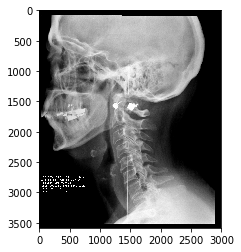

In [3]:
bucket='comprehend-medical-sa-interns'
key='images/x_ray.jpg'
my_bucket = s3_resource.Bucket(bucket)
my_image = my_bucket.Object(key)
response = my_image.get()
file_stream = response['Body']
print(file_stream)
print(type(file_stream))
img= Image.open(file_stream)
plt.imshow(np.asarray(img))

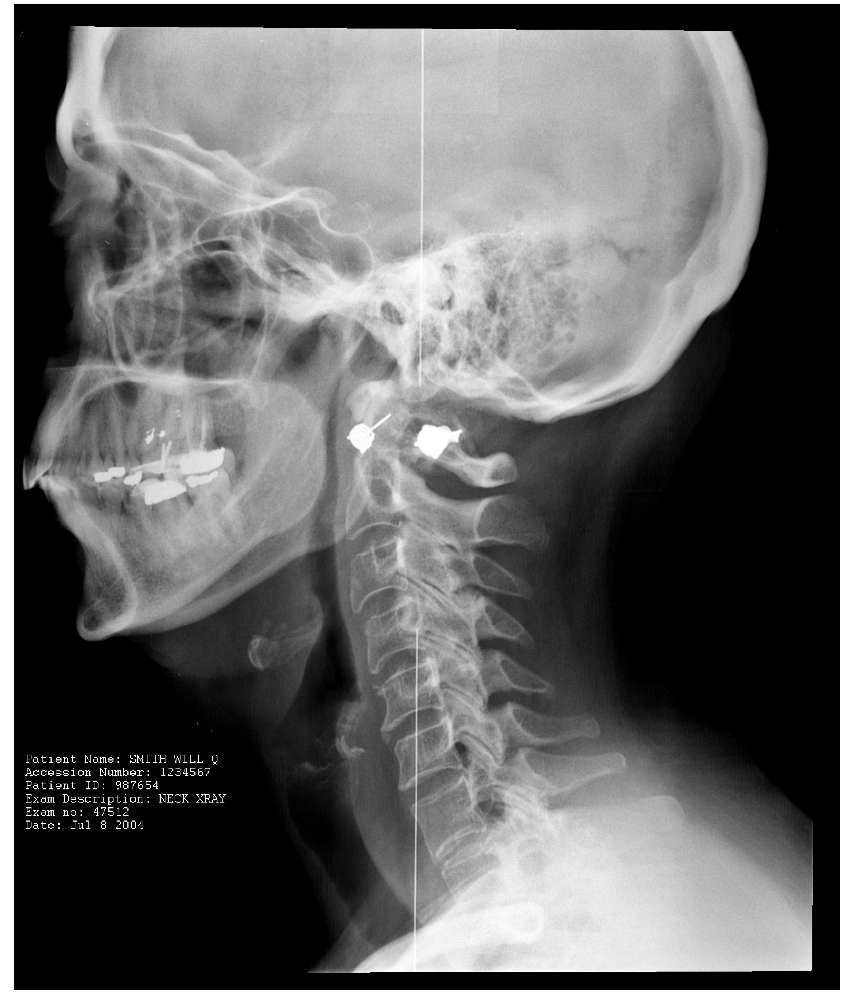

In [4]:
image = np.asarray(img)
w = image.shape[0]
h = image.shape[1]
figsize = w/float(80) , h/float(80)
fig = plt.figure(figsize=figsize)
ax = fig.add_axes([0, 0, 1, 1])

# Hide spines, ticks, etc.
ax.axis('off')
ax.imshow(img)
plt.show()

In [5]:
def detect_text(bucket, key):
    response = rekognition.detect_text(
        Image={
            'S3Object': {
                'Bucket': bucket,
                'Name': key
            }
        }
    )
    return response['TextDetections']

In [6]:
texts = detect_text(bucket, key)

In [7]:
threshold = 0.4
phi_boxes = []
for text in texts:
    if text['Type']=='LINE':
        response = comprehend_medical.detect_phi(Text = text['DetectedText'])
        if len(response['Entities'])!=0 and response['Entities'][0]['Score'] > threshold:
            box = []
            for x_y in text['Geometry']['Polygon']:
                box.append((x_y['X']*h,x_y['Y']*w))
            phi_boxes.append((text['DetectedText'],box))
            

Redacting PHI text "Patient Name: SMITH WILL Q" from image .....
Redacting PHI text "Accessi Number: 1234567" from image .....
Redacting PHI text "Patient ID: 987654" from image .....
Redacting PHI text "Date: Jul 8 2004" from image .....


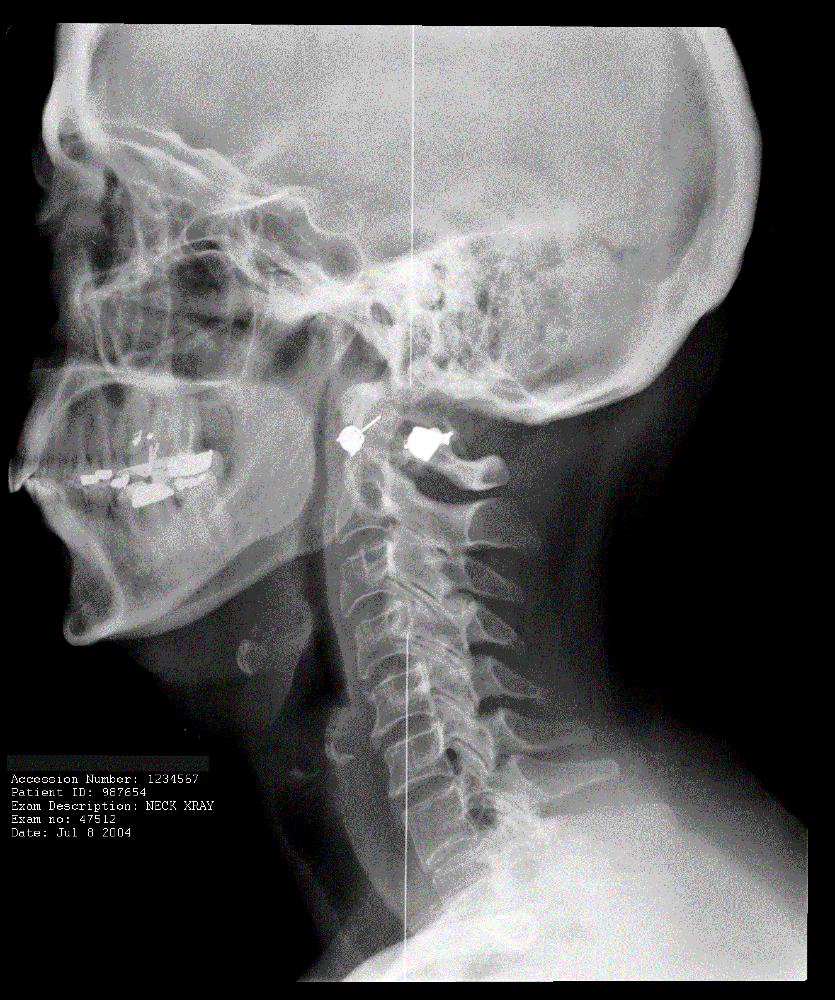

In [8]:
#PIL.ImageDraw.Draw.polygon(xy, fill=None, outline=None)
draw = ImageDraw.Draw(img)
frames =  []
for text,box in phi_boxes:
    print('Redacting PHI text "' + text + '" from image .....')
    draw.polygon(xy = box,fill=(20,20,20,100))
    frames.append(img.copy())
    draw.line(xy = box,fill=(255,255,255,255), width=7)
    frames.append(img.copy())
frames[0].save('redacted_image.gif', format='GIF', append_images=frames[1:], save_all=True, duration=300, loop=2)
with open('redacted_image.gif','rb') as file:
    display(IMG(file.read()))

In [9]:
out_img = BytesIO()
img.save(out_img, 'JPEG')
out_img.seek(0)  # Without this line it fails
my_bucket.put_object(
                       Key='yy.jpg',
                       Body=out_img)


s3.Object(bucket_name='comprehend-medical-sa-interns', key='yy.jpg')

# Lambda element

While the above solution is ideal to understand the underlying process, to automate and scale the solution we need to implement this using [AWS Lambda](https://docs.aws.amazon.com/lambda/index.html). We will add a S3 event notification to Lambda so that whenever a medical image is uploaded to S3 it will be processed and a new image will be created with after redacting PHI.

## PHI Redaction Architecture overview


![lamdba-architecture](Lambda_Architecture.jpg "PHI Redaction with Lambda")


Here's the process:
1. A user uploads the medical image to the S3 bucket.
2. A S3 object created event notification is send to the lambda function.
3. Lambda function downloads the image from S3 bucket and sends it to [Rekognition](https://docs.aws.amazon.com/rekognition/index.html).
4. Rekognotion detects the text and its position in the image and sends it back to lambda function.
5. Lambda function sends the detected text to [Comprehend Medical](https://docs.aws.amazon.com/comprehend/latest/dg/comprehend-med.html).
6. Comprehend Medical then detects the Personal Health Information from the text and sends it back to Lambda function.
7. Lambda function then using python libraries like opencv, pillow etc erases the PHI from the images and uploads the redacted image back to S3 bucket.

## Setting up the resources


#### Create and configure S3 bucket
* In the S3 console create a S3 bucket.
* Created two folders in the bucket named **Images** and **RedactedImages**.

#### Create an IAM role and policy for Lambda function

* In the IAM console create an execution role permissions for the lambda function.
* In the permission policy give lambda permission to read and write object from s3 bucket we created earlier.
* Also add permission to access Rekognition and Comprehend Medical.
* Give it permission to create and write logs to LogGroup.

```json
{
    "Version": "2012-10-17",
    "Statement": [
        {
            "Effect": "Allow",
            "Action": [
                "s3:PutObject",
                "s3:GetObject",
                "logs:CreateLogStream",
                "logs:PutLogEvents"
            ],
            "Resource": [
                "arn:aws:s3:::<BUCKET_NAME>/*",
                "arn:aws:logs:us-east-1:206264635948:log-group:/aws/lambda/<LOG_GROUP_NAME>:*"
            ]
        },
        {
            "Effect": "Allow",
            "Action": [
                "comprehendmedical:*",
                "rekognition:*"
            ],
            "Resource": "*"
        }
    ]
}
```


#### Create the lambda function

* In the Lambda Console choose create function.
* Choose a **Python 3.6**  as the runtime and attach the execution role we create earlier to the function.
* Click **Create function**.
* Add the code to process the image in the **inline code editor**.

```python
import json
import boto3
import numpy as np
import cv2
from io import BytesIO
s3 = boto3.client('s3')
s3_resource = boto3.resource('s3')
def lambda_handler(event, context):
    
  # Extract bucket name and file name from event object
  bucket = event['Records'][0]['s3']['bucket']['name']
  key = event['Records'][0]['s3']['object']['key']
  
  # Read Image
  my_bucket = s3_resource.Bucket(bucket)
  my_image = my_bucket.Object(key)
  response = my_image.get()
  file_stream = response['Body'].read()
  img_array = np.fromstring(file_stream, np.uint8)
  img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
  
  # Detect phi entities
  texts = detect_text(bucket, key)

  # Detect phi boxes
  phi_boxes = detect_phi_boxes(texts, img)
  
  # Erasing phi text from images
  img_redacted = redact_phi_from_images(phi_boxes,img)

  # save redacted image to s3
  key = key.replace('Images/','RedactedImages/')
  save_image(bucket,key,img_redacted)

  return {
    'statusCode': 200,
    'body': json.dumps('Hello from Lambda!')
  }


def detect_text(bucket, key):
  rekognition = boto3.client('rekognition')
  response = rekognition.detect_text(
    Image={
      'S3Object': {
        'Bucket': bucket,
        'Name': key
      }
    }
  )
  return response['TextDetections']


def detect_phi_boxes(texts, image):
  comprehend_medical = boto3.client('comprehendmedical')
  threshold = 0.3
  h = image.shape[1]
  w = image.shape[0]
  phi_boxes = []
  for text in texts:
    if text['Type']=='LINE':
      response = comprehend_medical.detect_phi(Text = text['DetectedText'])
      if len(response['Entities'])!=0 and response['Entities'][0]['Score'] > threshold:
        box = []
        x_y = text['Geometry']['BoundingBox']
        X = int(x_y['Left'] * h)
        Y = int(x_y['Top'] * w)
        W = int(x_y['Width'] * h)
        H = int(x_y['Height'] * w)
        box.append((X,Y,X+W,Y+H))                         # Store the TextBox x,y coordinates
        phi_boxes.append((text['DetectedText'],box))  

  return phi_boxes 


def redact_phi_from_images(phi_boxes,img):
  for text,box in phi_boxes :
    X1,Y1,X2,Y2 = box[0]
    
    # Hide text by creating a rectangle layer over it.
    
    img_filled = cv2.rectangle(img, (X1,Y1), (X2,Y2), (0,0,0),cv2.FILLED)  
    img_boxed = cv2.rectangle(img_filled, (X1,Y1), (X2,Y2), (255,255,255),cv2.LINE_4)
    
  return img_boxed 


def save_image(bucket,key,img):
  cv2.imwrite("/tmp/abc.jpg", img)
  s3.put_object(Bucket=bucket, Key=key, Body = open("/tmp/abc.jpg",'rb').read())

```


We are going to use Opencv and
